# Setup

In [84]:
import pandas as pd
from sklearn.model_selection import train_test_split
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import TruncatedSVD
import plotly.express as px

# Data Preprocessing

In [5]:
news_df = pd.read_excel("news.xlsx")

In [6]:
news_df.head()

,Category,Title,News_Article
0,Maraqlı,Naviforce Sport Saat 2016 ilə zövqlərin ahəngi,Naviforce Sport Saat 2016 Yapon Mexanizmi Yapo...
1,Maraqlı,"Sinir ,oynaq , sinir bel ağrılarına 3 gündə son !","ŞOK ! ŞOK ! ŞOK ! Xanımlar və bəylər , bel və ..."
2,Maraqlı,Dəyərindən qat-qat aşağı qiymətə Mənzil,Dəyərindən qat-qat Aşağı Qiymətə. Həzi Aslanov...
3,İdman,2024 və 2028-ci il olimpiadalarının keçiriləcə...,2028-ci il Yay Olimpiya və Paralimpiya Oyunla...
4,Dünya,Türkiyədə zəlzələ,Türkiyədə daha bir zəlzələ meydana gəlib. L...


In [7]:
news_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Category      50000 non-null  object
 1   Title         50000 non-null  object
 2   News_Article  50000 non-null  object
dtypes: object(3)
memory usage: 1.1+ MB


In [35]:
news_df['Category'].value_counts()

Category
Maraqlı         15865
Dünya           13474
Siyasət          6541
İqtisadiyyat     6368
İdman            6205
Mədəniyyət       1547
Name: count, dtype: int64

## Train-Test Split

In [8]:
X = news_df.drop(columns=['Category'])
y = news_df['Category']

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Explore Tokens

In [28]:
articles = X_train['News_Article']
test_articles = X_test['News_Article']

In [11]:
# Function to preprocess text
def preprocess(text):
    valid_characters = "abcçdeəfgğhxıijkqlmnoöprsştuüvyzw"  # Azerbaijani & English alphabet (lowercase)
    valid_characters += valid_characters.upper()  # Include uppercase
    # Convert to lowercase
    text = text.lower()
    # Keep only valid characters and spaces
    text = "".join([char if char in valid_characters + " " else "" for char in text])
    # Tokenize: split the text into words
    tokens = text.split()
    return tokens

In [12]:
processed_articles = [preprocess(sentence) for sentence in articles]
print(processed_articles[0])

['avropa', 'şurası', 'parlament', 'assambleyasının', 'aşpa', 'yeni', 'prezidentini', 'ilk', 'turda', 'seçmək', 'mümkün', 'olmayıbapa', 'xəbər', 'verir', 'ki', 'aşpanın', 'bu', 'gün', 'başlayan', 'payız', 'sessiyasında', 'oktyabrın', 'da', 'qurumun', 'prezidenti', 'vəzifəsindən', 'istefa', 'vermiş', 'pedro', 'aqramuntun', 'yerinə', 'yeni', 'prezident', 'seçilməli', 'idilakin', 'səsvermə', 'nəticəsində', 'prezidentliyə', 'namizədlər', 'avropa', 'xalq', 'partiyası', 'qrupundan', 'epp', 'xanım', 'stella', 'kyriakides', 'kipr', 'səs', 'və', 'emanuelis', 'zingeris', 'litva', 'səs', 'lazım', 'olan', 'qədər', 'səs', 'toplaya', 'bilməyiblərsəsvermədə', 'iştirak', 'edən', 'deputatların', 'sayı', 'az', 'olduğundan', 'ikinci', 'tur', 'elan', 'edilib', 'ikinci', 'tur', 'da', 'bu', 'gün', 'keçiriləcəkqeyd', 'edək', 'ki', 'yeni', 'prezident', 'ci', 'ilin', 'yanvar', 'ayına', 'qədər', 'bu', 'vəzifəni', 'icra', 'edəcək', 'aşpanın', 'yanvarda', 'keçiriləcək', 'qış', 'sessiyasında', 'quruma', 'yeni', 'pr

In [29]:
processed_test_articles = [preprocess(sentence) for sentence in test_articles]

In [17]:
all_tokens = [token for sentence in processed_articles for token in sentence]
token_counts = Counter(all_tokens)
vocabulary = [token for token, _ in token_counts.items()]
print(f"Vocabulary size: {len(vocabulary)}")

Vocabulary size: 236673


In [18]:
# Calculate cumulative coverage
sorted_tokens = token_counts.most_common()  # Sort by frequency
unique_tokens = [token for token, _ in sorted_tokens]
unique_frequencies = [freq for _, freq in sorted_tokens]
total_frequency = sum(unique_frequencies)
cumulative_unique_coverage = [sum(unique_frequencies[:i]) / total_frequency for i in range(1, len(unique_frequencies) + 1)]

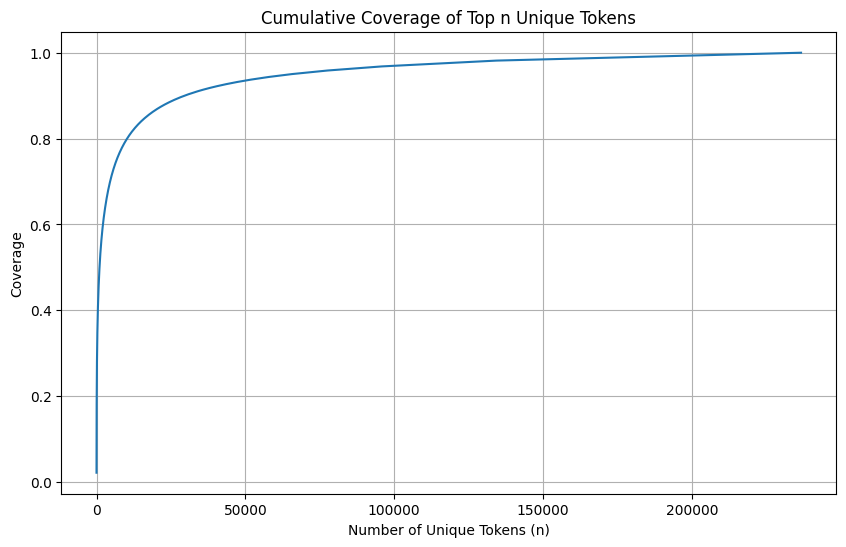

In [19]:
# Plot cumulative coverage
plt.figure(figsize=(10, 6))
plt.plot(cumulative_unique_coverage)
plt.title("Cumulative Coverage of Top n Unique Tokens")
plt.xlabel("Number of Unique Tokens (n)")
plt.ylabel("Coverage")
plt.grid(True)
plt.show()

## Extract Features

In [20]:
# Function to extract top n tokens (vacabulary)
def get_top_n_tokens(processed_articles, n):
    # Flatten the list of tokens
    all_tokens = [token for sentence in processed_articles for token in sentence]
    token_counts = Counter(all_tokens)
    # Get the top n most common tokens
    top_tokens = [token for token, _ in token_counts.most_common(n)]
    return top_tokens

In [21]:
# Function to create feature matrix using Bag-of-Words
def bag_of_words_feature_matrix(processed_articles, top_tokens):
    vectorizer = CountVectorizer(vocabulary=top_tokens)
    return vectorizer.fit_transform([" ".join(article) for article in processed_articles])

In [22]:
# Function to create feature matrix using TF-IDF
def tfidf_feature_matrix(processed_articles, top_tokens):
    vectorizer = TfidfVectorizer(vocabulary=top_tokens)
    return vectorizer.fit_transform([" ".join(article) for article in processed_articles])

In [23]:
n_values = [25000, 50000, 75000, 100000] # According to the graph's elbow

In [32]:
# Generate feature matrices for each n value
feature_matrices = {}
for n in n_values:
    # Get top n tokens
    top_tokens = get_top_n_tokens(processed_articles, n)
    print(f"Top {n} tokens: {top_tokens[:10]}")
    
    # Bag-of-Words Feature Matrix
    # Training data
    bow_train = bag_of_words_feature_matrix(processed_articles, top_tokens)
    tfidf_train = tfidf_feature_matrix(processed_articles, top_tokens)

    # Testing data
    bow_test = bag_of_words_feature_matrix(processed_test_articles, top_tokens)
    tfidf_test = tfidf_feature_matrix(processed_test_articles, top_tokens)

    # Store the feature matrices
    feature_matrices[n] = {
        "BoW": {"train": bow_train, "test": bow_test},
        "TF-IDF": {"train": tfidf_train, "test": tfidf_test},
    }

Top 25000 tokens: ['və', 'ki', 'bu', 'ilə', 'də', 'bir', 'üçün', 'da', 'görə', 'azərbaycan']
Top 50000 tokens: ['və', 'ki', 'bu', 'ilə', 'də', 'bir', 'üçün', 'da', 'görə', 'azərbaycan']
Top 75000 tokens: ['və', 'ki', 'bu', 'ilə', 'də', 'bir', 'üçün', 'da', 'görə', 'azərbaycan']
Top 100000 tokens: ['və', 'ki', 'bu', 'ilə', 'də', 'bir', 'üçün', 'da', 'görə', 'azərbaycan']


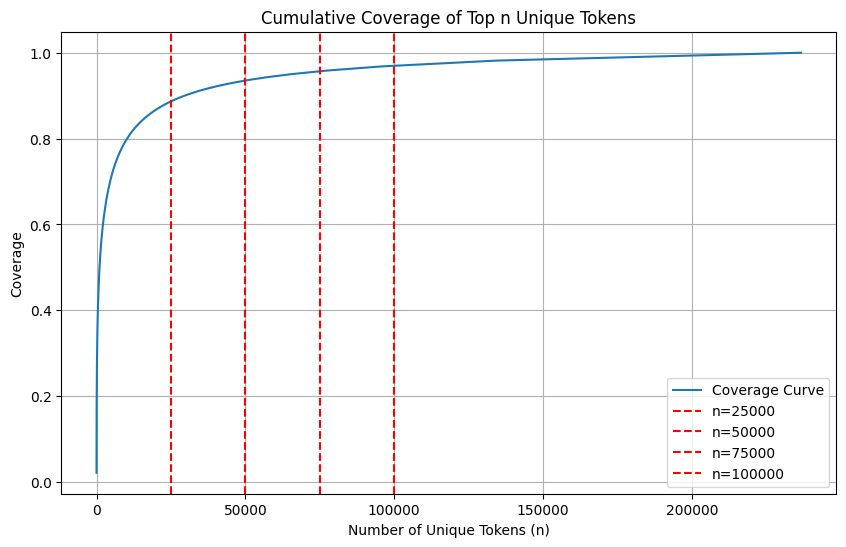

In [33]:
# Plot cumulative coverage with n thresholds
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_unique_coverage) + 1), cumulative_unique_coverage, label='Coverage Curve')
for n in n_values:
    plt.axvline(x=n, linestyle='--', color='red', label=f'n={n}')
plt.title("Cumulative Coverage of Top n Unique Tokens")
plt.xlabel("Number of Unique Tokens (n)")
plt.ylabel("Coverage")
plt.legend()
plt.grid(True)
plt.show()

# Modeling

In [34]:
def train_and_evaluate(X_train, X_test, y_train, y_test, model, model_name, feature_type, n):
    """
    Trains a model, evaluates it, and prints performance metrics.
    
    Args:
    - X_train, X_test: Feature matrices for train and test.
    - y_train, y_test: Target labels for train and test.
    - model: Machine learning model to train.
    - model_name: Name of the model (e.g., Decision Tree, Naïve Bayes).
    - feature_type: Feature representation used (BoW or TF-IDF).
    - n: Vocabulary size used for the feature extraction.
    
    Returns:
    - A dictionary with accuracy, precision, recall, F1 score, and confusion matrix.
    """
    # Train the model on the training set
    model.fit(X_train, y_train)
    
    # Generate predictions on the test set
    y_pred = model.predict(X_test)
    
    # Evaluate model performance
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average="weighted")
    recall = recall_score(y_test, y_pred, average="weighted")
    f1 = f1_score(y_test, y_pred, average="weighted")
    conf_matrix = confusion_matrix(y_test, y_pred)
    
    # Print performance metrics
    print(f"Model: {model_name}, Features: {feature_type}, n: {n}")
    print(f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}")
    print(f"Confusion Matrix:\n{conf_matrix}")
    print("-" * 50)
    
    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "conf_matrix": conf_matrix
    }

In [39]:
models = [
    (DecisionTreeClassifier(random_state=42), "Decision Tree"),
    (MultinomialNB(), "Naïve Bayes"),
    (SVC(kernel="linear", random_state=42), "SVC")
]

In [40]:
results = []

In [44]:
for n, matrices in feature_matrices.items():
    for model, model_name in models:
        # Train and evaluate for BoW
        bow_train = matrices["BoW"]["train"]
        bow_test = matrices["BoW"]["test"]
        results.append(
            train_and_evaluate(bow_train, bow_test, y_train, y_test, model, model_name, "BoW", n)
        )
        
        # Train and evaluate for TF-IDF
        tfidf_train = matrices["TF-IDF"]["train"]
        tfidf_test = matrices["TF-IDF"]["test"]
        results.append(
            train_and_evaluate(tfidf_train, tfidf_test, y_train, y_test, model, model_name, "TF-IDF", n)
        )

Model: Decision Tree, Features: BoW, n: 25000
Accuracy: 0.7332, Precision: 0.7331, Recall: 0.7332, F1: 0.7327
Confusion Matrix:
[[2110  418   14   88   50   65]
 [ 474 2308   48  109   86  147]
 [  26   76  139   45    1   17]
 [  81  158   18  890   23   99]
 [  92  107    8   24 1010   23]
 [  79  166   10  100   16  875]]
--------------------------------------------------
Model: Decision Tree, Features: TF-IDF, n: 25000
Accuracy: 0.7167, Precision: 0.7169, Recall: 0.7167, F1: 0.7165
Confusion Matrix:
[[2053  432   30   91   65   74]
 [ 507 2242   65  119  101  138]
 [  24   75  137   41    7   20]
 [  96  135   18  891   17  112]
 [  89  130    9   25  988   23]
 [  94  173   13  101    9  856]]
--------------------------------------------------
Model: Naïve Bayes, Features: BoW, n: 25000
Accuracy: 0.7884, Precision: 0.7957, Recall: 0.7884, F1: 0.7859
Confusion Matrix:
[[2227  287   21  104   32   74]
 [ 644 2040  108  110   82  188]
 [   6   46  246    5    1    0]
 [  95   15   32

Model: SVC, Features: BoW, n: 100000
Accuracy: 0.7907, Precision: 0.7928, Recall: 0.7907, F1: 0.7911
Confusion Matrix:
[[2232  385   10   70   27   21]
 [ 492 2421   39   70   57   93]
 [  17   67  197   21    0    2]
 [ 108  108   15  971    9   58]
 [  55   95    5   11 1094    4]
 [  54  126    4   66    4  992]]
--------------------------------------------------
Model: SVC, Features: TF-IDF, n: 100000
Accuracy: 0.8411, Precision: 0.8411, Recall: 0.8411, F1: 0.8402
Confusion Matrix:
[[2338  279    4   53   31   40]
 [ 394 2467   22   80   79  130]
 [  13   70  212    8    0    1]
 [  89   43   10 1066    9   52]
 [  18   31    1    6 1205    3]
 [  24   41    5   53    0 1123]]
--------------------------------------------------


We can see that increasing token count does not significantly affect accuracy. In terms of being close to 80%, Naive Bayes and SVC can be rounded to 80%; however, Decision Tree Classifier seems to overfit. That is why, we will apply more tuning on it.

In terms of feature extraction, Naive Bayes and DT performed best with Bag of Words while SVC improved more with TF-IDF.

## Prevent Overfitting

### Hyperparameter Tuning

In [83]:
bow_train = feature_matrices[25000]['BoW']['train']
bow_test = feature_matrices[25000]['BoW']['test']

In [46]:
param_grid = {
    "max_depth": [5, 10, 15, 20],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 5]
}

In [47]:
dt = DecisionTreeClassifier(random_state=42)

In [51]:
grid_search = GridSearchCV(estimator=dt, param_grid=param_grid, scoring="accuracy", cv=5)
grid_search.fit(bow_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'max_depth': [5, 10, 15, 20],
                         'min_samples_leaf': [1, 2, 5],
                         'min_samples_split': [2, 5, 10]},
             scoring='accuracy')

In [52]:
print("Best parameters:", grid_search.best_params_)
print("Best cross-validated accuracy:", grid_search.best_score_)

Best parameters: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best cross-validated accuracy: 0.6781750000000001


In [53]:
best_dt = grid_search.best_estimator_
y_pred = best_dt.predict(bow_test)
print("Test accuracy:", accuracy_score(y_test, y_pred))

Test accuracy: 0.6749


We can see the results got worse, so we will try another way to prevent overfitting.

### Use Another Decision Tree Based Model Less Prone to Overfitting

In [71]:
xgb = XGBClassifier(
    n_estimators=100,         # Number of boosting rounds
    max_depth=6,              # Depth of each tree
    learning_rate=0.1,        # Step size for each boosting round
    random_state=42,
    use_label_encoder=False,  # Avoid label encoding warning
    eval_metric="mlogloss"    # Multi-class log loss
)

In [74]:
# Encode labels (y_train and y_test)
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)  # Fit and transform training labels
y_test_encoded = label_encoder.transform(y_test)        # Only transform test labels

In [75]:
xgb.fit(bow_train, y_train_encoded)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...)

In [76]:
y_pred_xgb = xgb.predict(bow_test)

In [79]:
# Evaluate performance
accuracy_xgb = accuracy_score(y_test_encoded, y_pred_xgb)
precision_xgb = precision_score(y_test_encoded, y_pred_xgb, average="weighted")
recall_xgb = recall_score(y_test_encoded, y_pred_xgb, average="weighted")
f1_xgb = f1_score(y_test_encoded, y_pred_xgb, average="weighted")
conf_matrix_xgb = confusion_matrix(y_test_encoded, y_pred_xgb)

# Print results
print("XGBoost Results (BoW, n=25000):")
print(f"Accuracy: {accuracy_xgb:.4f}, Precision: {precision_xgb:.4f}, Recall: {recall_xgb:.4f}, F1: {f1_xgb:.4f}")
print(f"Confusion Matrix:\n{conf_matrix_xgb}")

XGBoost Results (BoW, n=25000):
Accuracy: 0.8206, Precision: 0.8217, Recall: 0.8206, F1: 0.8201
Confusion Matrix:
[[2287  352    6   54   29   17]
 [ 355 2564   18   67   63  105]
 [  15   89  169   18    0   13]
 [  71   87    7 1052    6   46]
 [  56   68    2    7 1125    6]
 [  76   93    2   64    2 1009]]


# Dimensionality Reduction

For dimensionality reduction, I opted for **TruncatedSVD** instead of **PCA** because our feature matrices (e.g., Bag-of-Words and TF-IDF) are sparse. Unlike PCA, which operates on dense matrices and requires converting the sparse matrix into a dense format (leading to high memory usage), **TruncatedSVD** can efficiently work directly with sparse data.

This choice is supported by [this article on TruncatedSVD vs PCA](https://dev.to/elldora/unveiling-the-hidden-gems-exploring-important-features-with-truncated-svd-and-pca-22j6#:~:text=PCA%20aims%20to%20find%20the,into%20two%20lower%20rank%20matrices.), which explains:
> "PCA aims to find the principal components by computing the eigenvalues and eigenvectors of the covariance matrix, while TruncatedSVD uses singular value decomposition (SVD) to decompose the sparse matrix into two lower rank matrices."

In [85]:
svd = TruncatedSVD(n_components=3, random_state=42)

# Apply dimensionality reduction on TF-IDF feature matrix
reduced_features = svd.fit_transform(feature_matrices[25000]["TF-IDF"]["train"])

# Create a DataFrame for visualization
reduced_df = pd.DataFrame(reduced_features, columns=["x", "y", "z"])
reduced_df["category"] = y_train.values  # Add original category labels

# Visualize with Plotly
fig = px.scatter_3d(
    reduced_df,
    x="x", y="y", z="z",
    color="category",
    title="3D Visualization of TF-IDF with Dimensionality Reduction",
    labels={"category": "Category"}
)
fig.show()

In [86]:
# Apply dimensionality reduction on BoW feature matrix
reduced_features_bow = svd.fit_transform(feature_matrices[25000]["BoW"]["train"])

# Create a DataFrame for visualization
reduced_df_bow = pd.DataFrame(reduced_features_bow, columns=["x", "y", "z"])
reduced_df_bow["category"] = y_train.values  # Add original category labels

# Visualize with Plotly
fig_bow = px.scatter_3d(
    reduced_df_bow,
    x="x", y="y", z="z",
    color="category",
    title="3D Visualization of BoW with Dimensionality Reduction",
    labels={"category": "Category"}
)
fig_bow.show()